In [1]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf

from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential

In [2]:
import pathlib
data_dir = 'C:\\Users\\starl\\Downloads\\class\\data2\\'
data_dir = pathlib.Path(data_dir).with_suffix('')

In [3]:
data_dir

WindowsPath('C:/Users/starl/Downloads/class/data2')

In [4]:
image_count = len(list(data_dir.glob('*/*.png')))
print(image_count)
# 데이터 사본의 총 개수

234


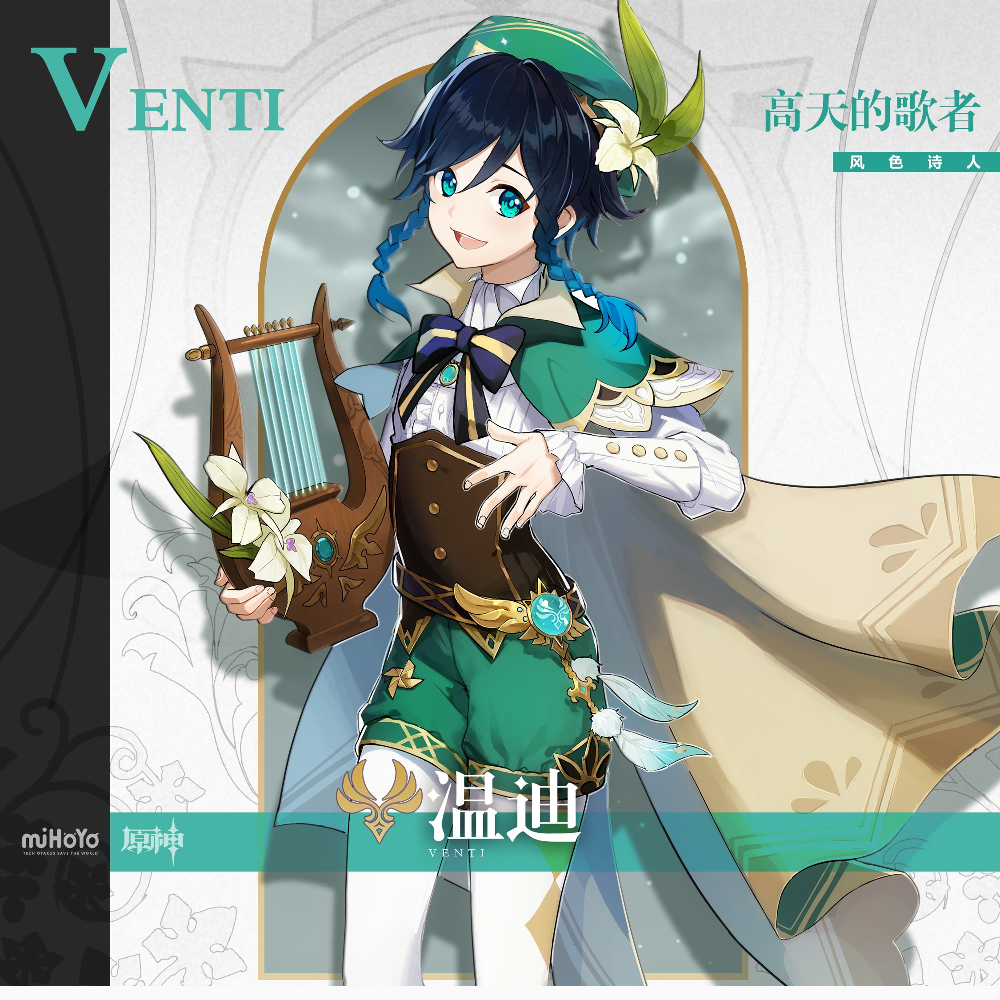

In [8]:
ventis = list(data_dir.glob('Venti/*'))
PIL.Image.open(str(ventis[0]))

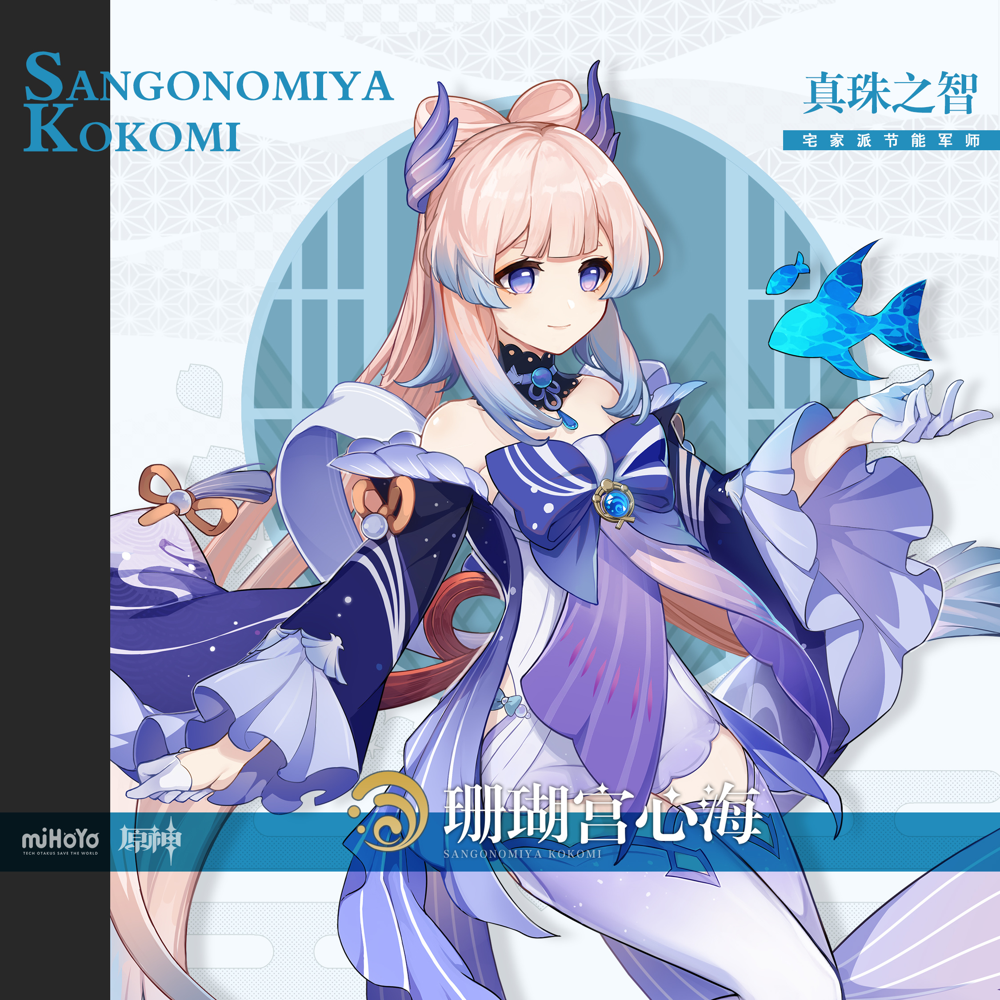

In [10]:
kokomi = list(data_dir.glob('Sangonomiya Kokomi/*'))
PIL.Image.open(str(kokomi[0]))

In [11]:
# 데이터셋 생성 ( 매개변수 지정 )
batch_size = 32
img_height = 180
img_width = 180

In [12]:
train_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="training",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 234 files belonging to 60 classes.
Using 188 files for training.


In [13]:
val_ds = tf.keras.utils.image_dataset_from_directory(
  data_dir,
  validation_split=0.2,
  subset="validation",
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

Found 234 files belonging to 60 classes.
Using 46 files for validation.


In [14]:
class_names = train_ds.class_names
print(class_names)

['Aether', 'Albedo', 'Aloy', 'Amber', 'Arataki Itto', 'Barbara', 'Beidou', 'Bennett', 'Candace', 'Chongyun', 'Collei', 'Cyno', 'Diluc', 'Diona', 'Dori', 'Eula', 'Fischl', 'Ganyu', 'Gorou', 'Hu Tao', 'Jean', 'Kaedehara Kazuha', 'Kaeya', 'Kamisato Ayaka', 'Kamisato Ayato', 'Keqing', 'Klee', 'Kujou Sara', 'Kuki Shinobu', 'Layla', 'Lisa', 'Lumine', 'Mona', 'Nahida', 'Nilou', 'Ningguang', 'Noelle', 'Qiqi', 'Raiden Shogun', 'Razor', 'Rosaria', 'Sangonomiya Kokomi', 'Sayu', 'Shenhe', 'Shikanoin Heizou', 'Sucrose', 'Tartaglia', 'Thoma', 'Tighnari', 'Venti', 'Xiangling', 'Xiao', 'Xingqiu', 'Xinyan', 'Yae Miko', 'Yanfei', 'Yelan', 'Yoimiya', 'Yun Jin', 'Zhongli']


In [15]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(5, 10, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")
    # 훈련 데이터세트 출력